In [2]:
import numpy as np
import os
import torch
from torch.optim import Adam, SGD, Adagrad, Adamax, Rprop
from torchvision import models
from filters_visualization import visualise_layer_filter, total_variation_loss
from aux_ops import preprocess_image, recreate_image
from torchinfo import summary

# Task 1
import matplotlib.pyplot as plt

# Task 2
from PIL import Image



# Task 1: Filters Visualization
## 1.1 - Load VGG16
We are loading a (pretrained) VGG16 via torchvision

In [3]:
# Select the device to work on.
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Only use the convolutional feature extraction layers of the model (no linear layers for class determination)
model = models.vgg16(weights='DEFAULT').features

model.eval()
# Fix model weights
for param in model.parameters():
	param.requires_grad = False
model.to(device)

summary(model, input_size=(1, 3, 224, 224))

c:\Users\adria\anaconda3\envs\genai\Lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [1, 512, 7, 7]            --
├─Conv2d: 1-1                            [1, 64, 224, 224]         (1,792)
├─ReLU: 1-2                              [1, 64, 224, 224]         --
├─Conv2d: 1-3                            [1, 64, 224, 224]         (36,928)
├─ReLU: 1-4                              [1, 64, 224, 224]         --
├─MaxPool2d: 1-5                         [1, 64, 112, 112]         --
├─Conv2d: 1-6                            [1, 128, 112, 112]        (73,856)
├─ReLU: 1-7                              [1, 128, 112, 112]        --
├─Conv2d: 1-8                            [1, 128, 112, 112]        (147,584)
├─ReLU: 1-9                              [1, 128, 112, 112]        --
├─MaxPool2d: 1-10                        [1, 128, 56, 56]          --
├─Conv2d: 1-11                           [1, 256, 56, 56]          (295,168)
├─ReLU: 1-12                             [1, 256, 56, 

## 1.2 - Optimize input image


In [3]:
optimized_image = visualise_layer_filter(model, layer_nmbr=28, filter_nmbr=20, print_metadata=True)

p:\Masterstudium\SS24\GenAIVisSynth\tutorial\5tutorial\filters_visualization.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


--------------------------------
layer; Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
shape: torch.Size([1, 64, 224, 224])
mean: -0.06995631009340286
min: -3.5926921367645264
max: 4.721126556396484
--------------------------------
layer; ReLU(inplace=True)
shape: torch.Size([1, 64, 224, 224])
mean: 0.266907274723053
min: 0.0
max: 4.721126556396484
--------------------------------
layer; Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
shape: torch.Size([1, 64, 224, 224])
mean: -0.268771767616272
min: -13.084360122680664
max: 13.657594680786133
--------------------------------
layer; ReLU(inplace=True)
shape: torch.Size([1, 64, 224, 224])
mean: 0.5712560415267944
min: 0.0
max: 13.657594680786133
--------------------------------
layer; MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
shape: torch.Size([1, 64, 112, 112])
mean: 1.295302152633667
min: 0.0
max: 13.657594680786133
--------------------------------
layer; Conv2d(64, 

## Task 1.3 - Visualize a random filter.

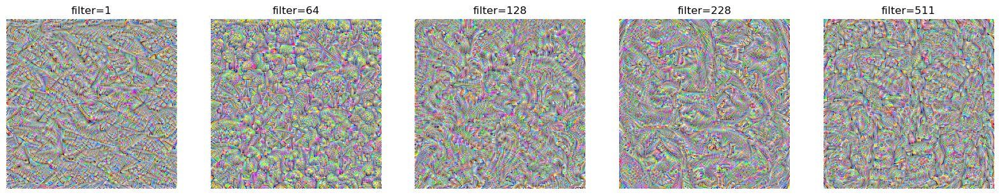

In [4]:
figure, axs = plt.subplots(1,5, figsize=(20,5))
filter_numbers = [1, 64, 128, 228, 511]

# Visualize different filters
for i, filter_nmbr in enumerate(filter_numbers):
	optimized_image = visualise_layer_filter(model, layer_nmbr=28, filter_nmbr=filter_nmbr)
	axs[i].imshow(optimized_image)
	axs[i].set_title(f'filter={filter_nmbr}')
	axs[i].axis('off')

plt.show()

## Task 1.4 - Visualize filters at different layers.

p:\Masterstudium\SS24\GenAIVisSynth\tutorial\5tutorial\filters_visualization.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


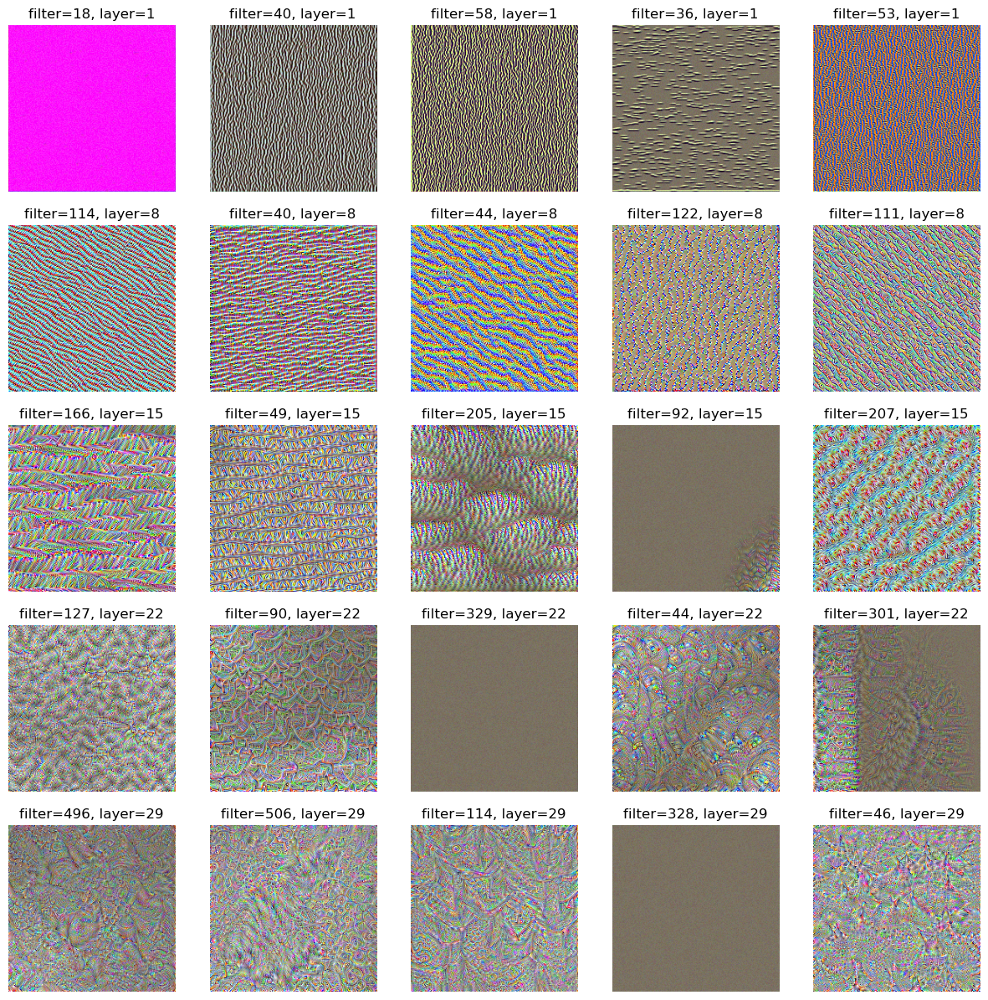

In [14]:
figure, axs = plt.subplots(5,5, figsize=(15,15))
layer_numbers = [1, 8, 15, 22, 29] # out_channels is only accessible for conv layers, so only take conv layers

for i, layer_nmbr in enumerate(layer_numbers):
	# Find filter count from specific layer
	filters = model[layer_nmbr-1].out_channels
	# Draw 7 random filters
	random_filters = np.random.choice(filters, size=5, replace=False)

	for j, random_filter in enumerate(random_filters):
		optimized_image = visualise_layer_filter(model, layer_nmbr=layer_nmbr, filter_nmbr=random_filter)
		axs[i, j].imshow(optimized_image)
		axs[i, j].axis('off')
		axs[i, j].set_title(f'filter={random_filter}, layer={layer_nmbr}')

The shapes of the activations get more and more complex starting from simple patterns to curvy patterns of all shapes. Interestingly some filter seem to be dead only display a brown image. 

## Task 1.5 - Hyperparameter tuning.


C:\Users\adria\AppData\Local\Temp\ipykernel_8168\780847065.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


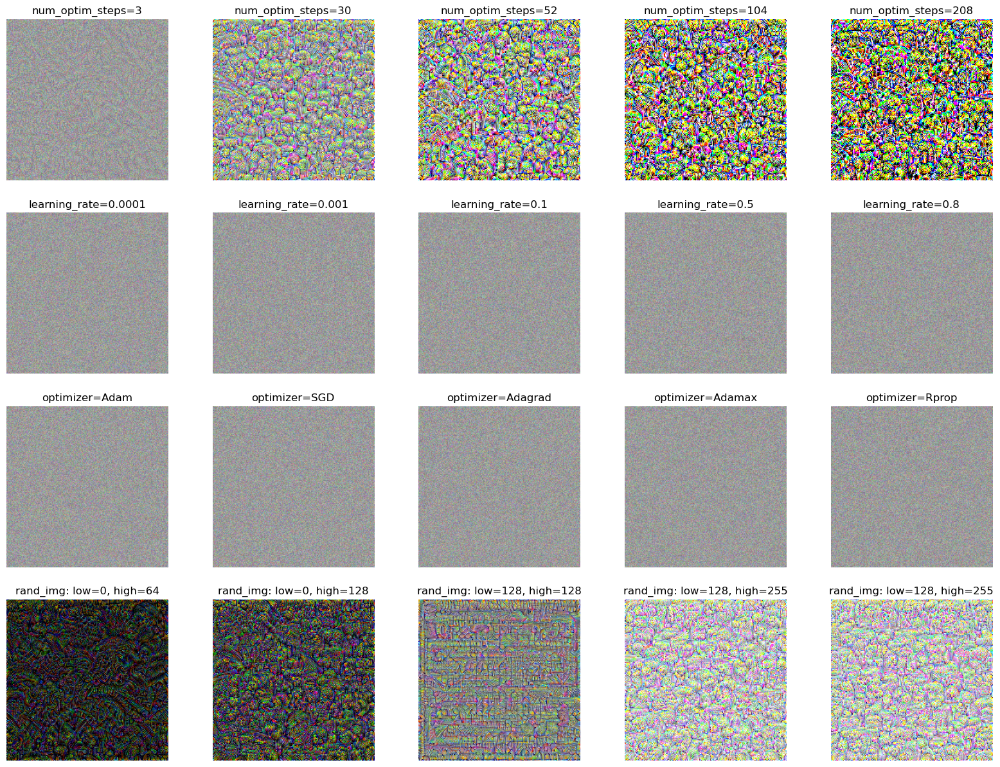

In [6]:
layer_nmbr = 28
filter_nmbr = 64

# Create random image
rand_img = np.uint8(np.random.uniform(low=120,
										high=190,
										size=(224, 224, 3)))

# Process image and return variable
processed_image = preprocess_image(rand_img, False)
processed_image = torch.tensor(processed_image, device=device).float()
processed_image.requires_grad = True


figure, axs = plt.subplots(4,5, figsize=(20,15))

# Try out different training lengths
training_lengths = [3, 30, 52, 104, 208]
optimizer = Adam([processed_image], lr=0.1, weight_decay=1e-5)
for i in range(5):
	optimized_image = visualise_layer_filter(model, filter_nmbr=filter_nmbr, layer_nmbr=layer_nmbr, num_optim_steps=training_lengths[i])
	axs[0, i].imshow(optimized_image)
	axs[0, i].axis('off')
	axs[0, i].set_title(f'num_optim_steps={training_lengths[i]}')

# Try out different learning rates
learning_rates = [0.0001, 0.001, 0.1, 0.5, 0.8]
optimizer = Adam([processed_image], lr=0.1, weight_decay=1e-5)
for i in range(5):
	optimizer = Adam([processed_image], lr=learning_rates[i], weight_decay=1e-5)
	optimized_image = visualise_layer_filter(model, custom_optimizer=optimizer, filter_nmbr=filter_nmbr, layer_nmbr=layer_nmbr)
	axs[1, i].imshow(optimized_image)
	axs[1, i].axis('off')
	axs[1, i].set_title(f'learning_rate={learning_rates[i]}')

# Try out different optimizer
optimizers = [
	Adam([processed_image], lr=0.1, weight_decay=1e-5),
	SGD([processed_image], lr=0.1, weight_decay=1e-5),
	Adagrad([processed_image], lr=0.1, weight_decay=1e-5),
	Adamax([processed_image], lr=0.1, weight_decay=1e-5),
	Rprop([processed_image], lr=0.1)
]
optimizer_names = ['Adam', 'SGD', 'Adagrad', 'Adamax', 'Rprop']
for i in range(5):
	optimized_image = visualise_layer_filter(model, custom_optimizer=optimizers[i], filter_nmbr=filter_nmbr, layer_nmbr=layer_nmbr)
	axs[2, i].imshow(optimized_image)
	axs[2, i].axis('off')
	axs[2, i].set_title(f'optimizer={optimizer_names[i]}')

# Try out different rand_img initializations
low_values = [0, 0, 128, 128, 128]
high_values = [64, 128, 128, 255, 255]
rand_images = [
	np.uint8(np.random.uniform(low=low_values[0], high=high_values[0], size=(224, 224, 3))),
	np.uint8(np.random.uniform(low=low_values[1], high=high_values[1], size=(224, 224, 3))),
	np.uint8(np.random.uniform(low=low_values[2], high=high_values[2], size=(224, 224, 3))),
	np.uint8(np.random.uniform(low=low_values[3], high=high_values[3], size=(224, 224, 3))),
	np.uint8(np.random.uniform(low=low_values[4], high=high_values[4], size=(224, 224, 3)))
]
for i in range(5):
	image = rand_images[i]
	optimized_image = visualise_layer_filter(model, image=image, filter_nmbr=filter_nmbr, layer_nmbr=layer_nmbr)
	axs[3, i].imshow(optimized_image)
	axs[3, i].axis('off')
	axs[3, i].set_title(f'rand_img: low={low_values[i]}, high={high_values[i]}')

plt.show()



**num_optim_steps:** The number of training steps has a big effect on the activations. The longer the more training steps, the bigger the activation.

**learning_rate:** The learning rate should have the same effect as the num_optim_steps. This effect I cannot observe. I assume this comes from a bug. I pass the optimizer with the correct learning rate to the visualize_filter_layer function where it also gets assigned to the optimizer variable. For some reason, it does not work as expected though. 

**Optimizer:** Same issue as for learning_rate

**rand_img:** The initial pixel colors have a huge impact on the output. when starting with lower value pixels, the final activation will also be darker and starting with higher pixels the final activation will also be brighter. When starting with exactly 128 pixels, the colors are in the middle range.

## Task 1.6 - Pretrained weights.


p:\Masterstudium\SS24\GenAIVisSynth\tutorial\5tutorial\filters_visualization.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


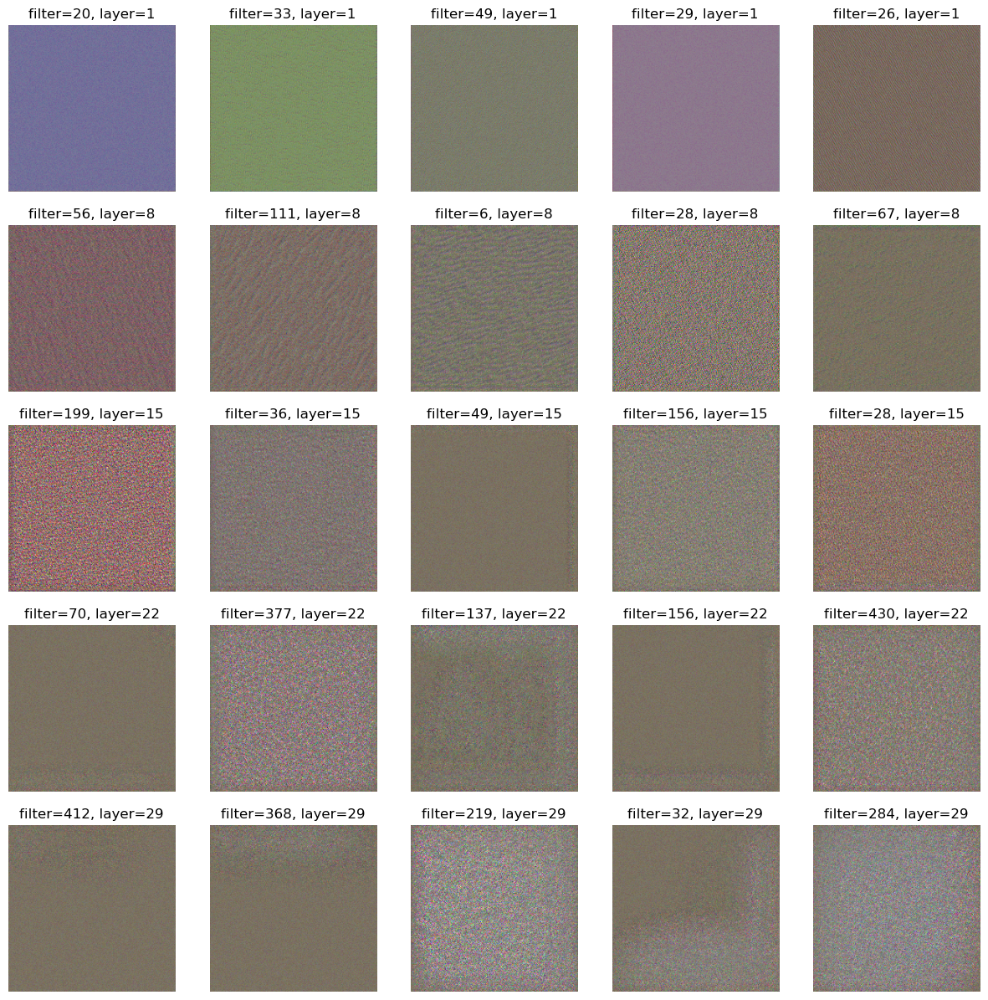

In [13]:
# Initialize untrained model
model_untrained = models.vgg16().features

model_untrained.eval()
# Fix model weights
for param in model_untrained.parameters():
	param.requires_grad = False
model_untrained.to(device)


figure, axs = plt.subplots(5,5, figsize=(15,15))
layer_numbers = [1, 8, 15, 22, 29] # out_channels is only accessible for conv layers, so only take conv layers

for i, layer_nmbr in enumerate(layer_numbers):
	# Find filter count from specific layer
	filters = model[layer_nmbr-1].out_channels
	# Draw 7 random filters
	random_filters = np.random.choice(filters, size=5, replace=False)

	for j, random_filter in enumerate(random_filters):
		optimized_image = visualise_layer_filter(model_untrained, layer_nmbr=layer_nmbr, filter_nmbr=random_filter)
		axs[i, j].imshow(optimized_image)
		axs[i, j].axis('off')
		axs[i, j].set_title(f'filter={random_filter}, layer={layer_nmbr}')

The model is untrained, so the activations don't show any specfic shapes. They just show random noise in different colors

# Task 2: Deep Dream

## Task 1.1 Most activated filters for every image

In [8]:
def find_top_10_filters(model, image, layer_nmbr=28):
			
	# Preprocess image
	processed_image = preprocess_image(image, True)
	processed_image = processed_image.to(device).float()

	# Perform 1 forward pass to find find the 10 most activated filters
	x = processed_image
	for index, layer in enumerate(model.children()):
		# Forward pass layer by layer
		x = layer(x)
		if index == layer_nmbr:
			break
	
	conv_output = x[0] # take all filters

	# Sum activations over h, w dimensionns and then sort them to select the top 10 filter
	activations_sum = torch.sum(conv_output, dim=(1, 2))
	top_10_filters = torch.argsort(activations_sum, descending=True)[0:10]

	return top_10_filters

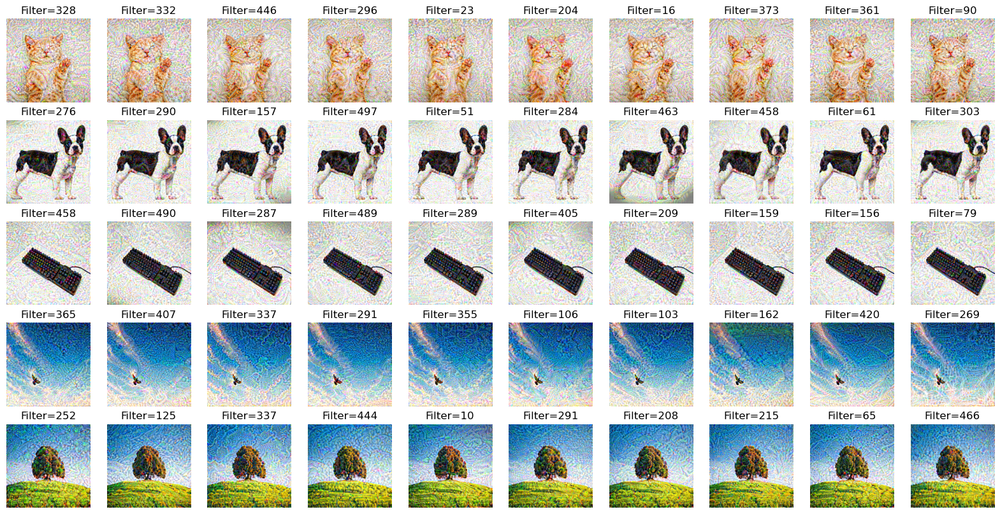

In [9]:
model = models.vgg16(weights='DEFAULT').features.to(device)
model.eval()
# Fix model weights
for param in model.parameters():
	param.requires_grad = False

layer_nmbr = 30 # fix at certain layer 

image_paths = ['./images/cat.png', './images/dog.png', './images/keyboard.png', './images/bird.png', './images/tree.png']

figure, axs = plt.subplots(5,10, figsize=(20,10))

for i, image_path in enumerate(image_paths):
	image = Image.open(image_path)
	top_10_filters = find_top_10_filters(model, image, layer_nmbr)

	for j, filter in enumerate(top_10_filters):
		optimized_image = visualise_layer_filter(model, layer_nmbr, filter_nmbr=filter, image=image)
		axs[i][j].imshow(optimized_image)
		axs[i][j].set_title(f'Filter={filter}')
		axs[i][j].axis('off')

plt.show()

- All of the most activated filters have shaped patterns with strong colors.
- Mostly filters with high numbers are the most activated ones
- Most of the filters look different from each other

## Task 1.2 Total variation loss.

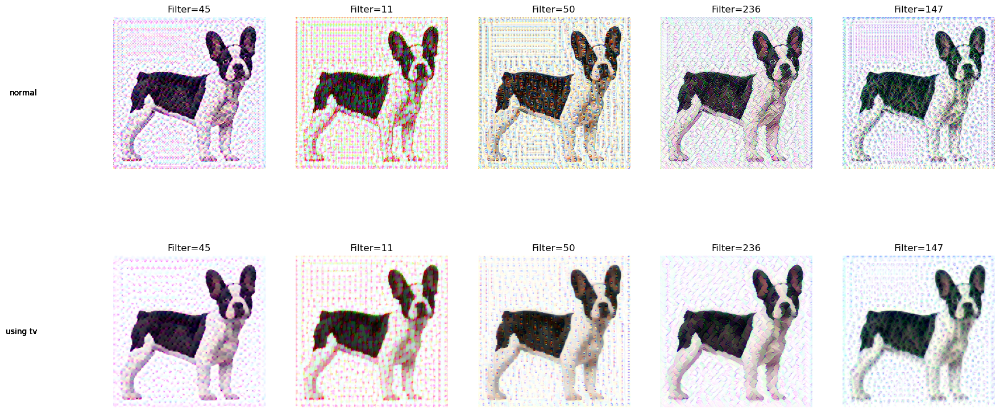

In [16]:

image = Image.open('images/dog.png')
top_10_filters = find_top_10_filters(model, image, 10)

figure, axs = plt.subplots(2,5, figsize=(20,10))

for j, filter in enumerate(top_10_filters[0:5]):
	optimized_image = visualise_layer_filter(model, layer_nmbr=10, filter_nmbr=filter, image=image)
	optimized_image_tv = visualise_layer_filter(model, layer_nmbr=10, filter_nmbr=filter, image=image, useTVL=True)
	axs[0][j].imshow(optimized_image)
	axs[0][j].set_title(f'Filter={filter}')
	axs[0][j].axis('off')
	axs[0][0].text(-0.5, 0.5, "normal", va='center', ha='right', transform=axs[0][0].transAxes)
	axs[1][j].imshow(optimized_image_tv)
	axs[1][j].set_title(f'Filter={filter}')
	axs[1][j].axis('off')
	axs[1][0].text(-0.5, 0.5, "using tv", va='center', ha='right', transform=axs[1][0].transAxes)

plt.show()

When using the total variational loss the image becomes smoother. IT looks a bit like it has been drawn on an oil painting as the edges aren't so strongly visible anymore.

## Task 1.3 Deep dream.

In [5]:
# Define the function, that backpropagates the normalized activation of multiple layers into an input image
def deep_dream(model, image,  layer_numbers, num_optim_steps=26, tv_weight=1e-5):

	# Preprocess image
	processed_image = preprocess_image(image, True)
	processed_image = torch.tensor(processed_image, device=device).float()
	processed_image.requires_grad = True

	optimizer = Adam([processed_image], lr=0.1, weight_decay=1e-5)
	
	for i in range(num_optim_steps):
			optimizer.zero_grad()
			x = processed_image
			# Calculate the sum of multiple layer activations
			total_activation = 0
			for index, layer in enumerate(model.children()):
					# Forward pass layer by layer
					x = layer(x)
					if index in layer_numbers:
							total_activation += torch.norm(x) # Use the L2 norm to regularize the values
			
			# Calculate the tv loss and add it together
			loss_tv = total_variation_loss(processed_image, tv_weight)
			loss = -total_activation + loss_tv
			
			loss.backward()
			optimizer.step()

	# Recreate image
	optimized_image = recreate_image(processed_image.cpu())
	return optimized_image


C:\Users\adria\AppData\Local\Temp\ipykernel_26256\2717928019.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  processed_image = torch.tensor(processed_image, device=device).float()


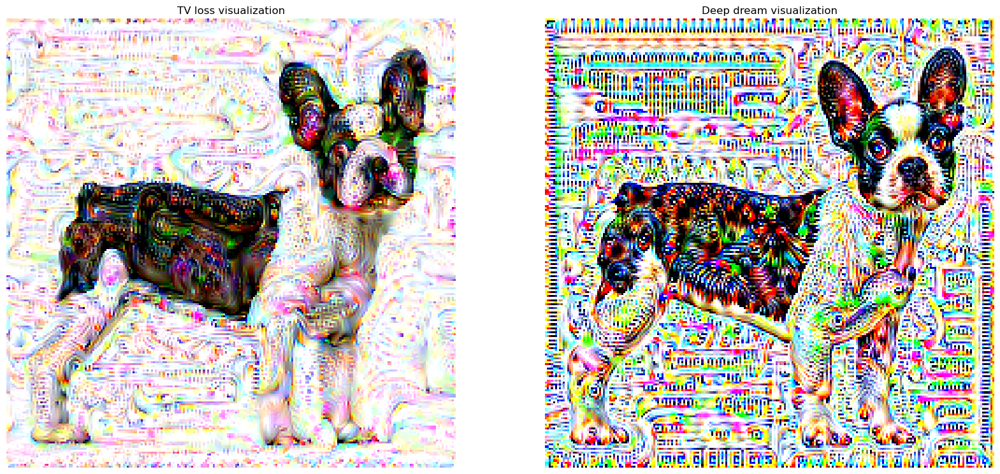

In [6]:
# Perform deep dream

model = models.vgg16(weights='DEFAULT').features.to(device)
model.eval()
# Fix model weights
for param in model.parameters():
	param.requires_grad = False


image = Image.open('images/dog.png')
figure, axs = plt.subplots(1,2, figsize=(20,10))

# One needs to use convolutional layers, or the will be an exception.
conv_layers = [1, 3, 6, 8, 11, 13, 15, 18, 20, 22, 25, 27, 29] 
layer_numbers = [1, 8, 15, 22, 29]


optimized_image_tv = visualise_layer_filter(model, image=image, filter_nmbr=20, layer_nmbr=28, num_optim_steps=50, useTVL=True)
optimized_image_deep_dream = deep_dream(model, image, layer_numbers=layer_numbers, num_optim_steps=50, tv_weight=1e-3)

axs[0].imshow(optimized_image_tv)
axs[0].set_title("TV loss visualization")
axs[0].axis('off')
axs[1].imshow(optimized_image_deep_dream)
axs[1].set_title("Deep dream visualization")
axs[1].axis('off')

plt.show()

- The deep dream image is way stronger activated than when using the previous method (tv_loss on specific filter and layer)
- On can also see features inside the image. This goes especially for eyes. 